# Vignette 1: Example usage of CITEgeist on Visium Data to examine cancer cell heterogeneity in a biopsy

This notebook demonstrates how to use CITEgeist to analyze spatial transcriptomics data from a cancer biopsy sample. We'll explore cellular heterogeneity and interactions within the tumor microenvironment using Visium spatial data.

In [1]:
# USER DEFINED VARIABLES

LICENSE_FILE = "/ihome/crc/install/gurobi/gurobi1102/linux64/lic/gurobi.lic"
DATA_FOLDER = "/bgfs/alee/LO_LAB/General/Lab_Data/20250210_CITEGeistPublicData_GEO_Alex/processed_files/"


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys
import os
import importlib

sys.path.insert(0, os.path.abspath('..'))


## Setting up the Analysis Environment

Before using CITEgeist, it's crucial to understand that Visium data reports spatial coordinates at different scales depending on SpaceRanger settings. CITEgeist relies on accurate neighborhood rings for deconvolution, so we've developed visualization tools to help determine the correct radii for your specific dataset.

When running multiple samples in a joint analysis, we recommend testing multiple samples to find consistent radius parameters. As a rule of thumb, your neighborhoods must have as many or more spots than the number of cell types you aim to deconvolute.

/bgfs/alee/LO_LAB/Personal/Alexander_Chang/alc376/envs/CITEgeist_env/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/bgfs/alee/LO_LAB/Personal/Alexander_Chang/alc376/envs/CITEgeist_env/lib/python3.10/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/bgfs/alee/LO_LAB/Personal/Alexander_Chang/alc376/envs/CITEgeist_env/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/bgfs/alee/LO_LAB/Personal/Alexander_Chang/alc376/envs/CITEgeist_env/lib/pytho

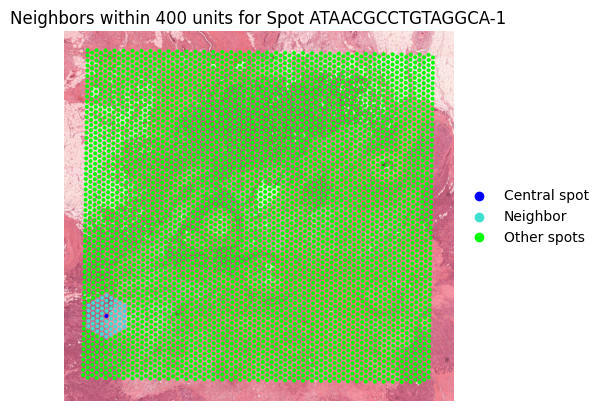

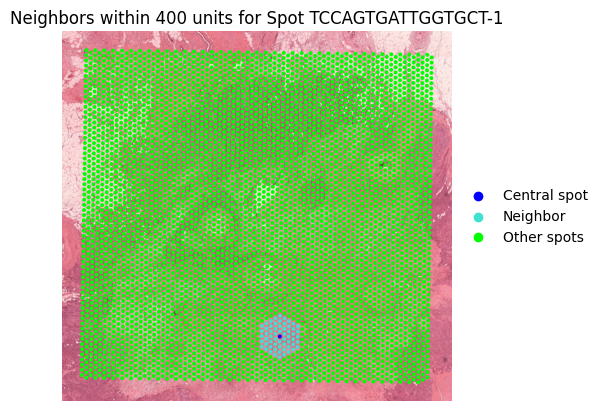

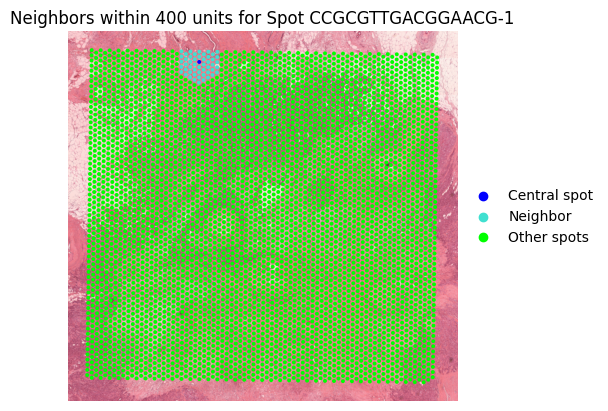

In [4]:
import scanpy as sc
import squidpy as sq
from model.utils import plot_neighbors_with_fixed_radius

# Load dataset
path_to_visium_folder = os.path.join(DATA_FOLDER, "HCC22-088-P1-S2/outs")
adata = sq.read.visium(path_to_visium_folder, counts_file='filtered_feature_bc_matrix.h5', load_images=True, gex_only=False)


# Test neighbor radius visualization
plot_neighbors_with_fixed_radius(adata, radius=400, num_spots=3)


## Cell Type Profiles

We need to define cell profiles that specify the antibody markers for each cell type of interest. These profiles require manual curation and are divided into "Major" and "Minor" antibodies. Currently, only Major antibodies are used in the analysis, but Minor antibodies are included for future versions.

Note: The "-1" suffix for antibodies is necessary because Scanpy/Squidpy cannot differentiate between Antibody Capture and Gene Expression variables when reading the data.

In [5]:
cell_profiles = {
    "Cancer Cells": {
        "Major": ["EPCAM-1"],
        "Minor": ["SDC1-1",  "KRT5-1"]  # CD138 - possible cancer stem cell marker
    },
    "Macrophages": {
        "Major": ["CD68-1" ],  # General macrophage and M2-polarized macrophages
        "Minor": ["CD14-1"]  # Monocyte/macrophage lineage marker
    },
    "CD4 T Cells": {
        "Major": ["CD3E-1", "CD4-1"],  # General, Helper, and Cytotoxic T cells
    },
    "CD8 T Cells": {
        "Major": ["CD3E-1", "CD8A-1"],  # General, Helper, and Cytotoxic T cells
    },
    "B Cells": {
        "Major": ["MS4A1-1", "CD19-1"],  # General B cell markers and developmental marker
    },
    "Endothelial Cells": {
        "Major": ["PECAM1-1"],  # CD31 - endothelial cell marker
    },
    "Fibroblasts": {
        "Major": ["ACTA2-1"],  # α-SMA - myofibroblast marker, indicates activated stroma
    }
}


In [6]:
import scanpy as sc
import importlib
import model
importlib.reload(model)
from model import CitegeistModel  # Now directly import from the module
# Reload the model module if you're actively developing

# Initialize the model
model = CitegeistModel(sample_name="HCC22-088-P1-S2", adata=adata, output_folder='output')

# Load cell profile dictionary
model.load_cell_profile_dict(cell_profiles)

# Preprocess and run models
# Split into gene expression and antibody capture datasets
model.split_adata()

model.filter_gex(nonzero_percentage=0.01, mean_expression_threshold=1.1, min_counts=100)

model.copy_gex_to_protein_adata()

# Preprocess datasets
model.preprocess_gex()
model.preprocess_antibody()
print(model)

# Register Gurobi license
model.register_gurobi(LICENSE_FILE)


global_cell_type_proportions_df, finetuned_cell_type_proportions_df = model.run_cell_proportion_model(radius=400)


# Plot cell proportions (Append cell proportions) 
model.append_proportions_to_adata(key='finetuned')

# Run gene expression model (if needed)
# model.run_gex_model()
prop_adata = model.get_adata()

print(prop_adata)



CitegeistModel initialized successfully.
AnnData has been successfully split into 'gene_expression_adata' and 'antibody_capture_adata'.
Filtered gene expression data: 18085 → 10029 genes (count > 0 in at least 1.0% of spots, mean expression > 1.1 in nonzero spots). Remaining spots: 4853 Filtered spots: 4992 to 4853
Antibody capture data preprocessing completed: Winsorized, CLR applied, no NaNs detected.
CitegeistModel Summary:
- Output Folder: output
- Main AnnData Loaded: Yes
- Gene Expression AnnData Loaded: Yes
- Antibody Capture AnnData Loaded: Yes
- Cell Profile Dictionary Loaded: Yes
- Gene Expression Preprocessed: Yes
- Antibody Capture Preprocessed: Yes
✅ Gurobi license file has been successfully configured.
 - GRB_LICENSE_FILE: /ihome/crc/install/gurobi/gurobi1102/linux64/lic/gurobi.lic
Set parameter GURO_PAR_SPECIAL
Set parameter TokenServer to value "10.201.0.113"


Refining Cell Proportions: 100%|████████████████████| 4853/4853 [14:21<00:00,  5.64it/s]



Before sorting:
CSV spots 1-10: ['AACACCTACTATCGAA-1', 'AACACTTGGCAAGGAA-1', 'AACAGGAAGAGCATAG-1', 'AACAGGATTCATAGTT-1', 'AACAGGCCAACGATTA-1', 'AACAGGTTATTGCACC-1', 'AACAGGTTCACCGAAG-1', 'AACAGTCAGGCTCCGC-1', 'AACAGTCCACGCGGTG-1', 'AACAGTCGTGTCGCGG-1']
AnnData spots 1-10: ['AACACCTACTATCGAA-1', 'AACACTTGGCAAGGAA-1', 'AACAGGAAGAGCATAG-1', 'AACAGGATTCATAGTT-1', 'AACAGGCCAACGATTA-1', 'AACAGGTTATTGCACC-1', 'AACAGGTTCACCGAAG-1', 'AACAGTCAGGCTCCGC-1', 'AACAGTCCACGCGGTG-1', 'AACAGTCGTGTCGCGG-1']
✅ Cell type proportions have been appended to adata.obs and results['cell_prop']
✅ Returning the internal AnnData object.
AnnData object with n_obs × n_vars = 4853 × 10029
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'size_factors', 'original_total', 'scaled_total', 'Cancer Cells', 'Macrophages', 'CD4 T Cells', 'CD8 T Cells', 'B Cells', 'Endothelial Cells', 'Fibroblasts'
    var: 'gene_ids', 'feature_types', 'genome', 'isotype_control', 'normalized', 'pattern', 'read', 'secondary_name'

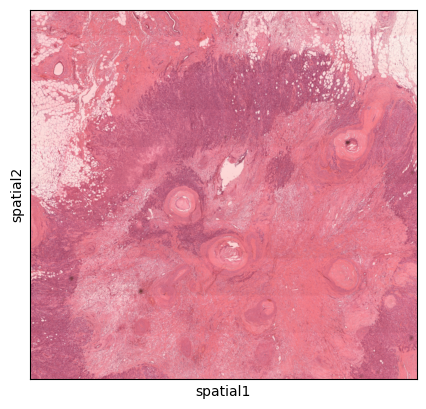

In [7]:
sc.pl.spatial(prop_adata)

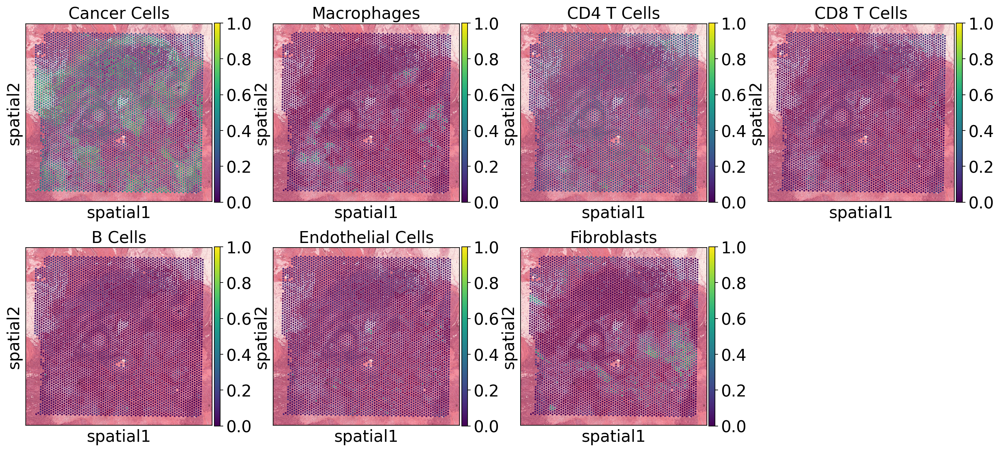

In [8]:
# First set the figure parameters globally
sc.set_figure_params(fontsize=19)

# Then create the plot without the fontsize parameter
sc.pl.spatial(
    prop_adata,
    color=["Cancer Cells", "Macrophages", "CD4 T Cells", "CD8 T Cells", "B Cells", "Endothelial Cells", "Fibroblasts"], 
    vmin=0, 
    vmax=1
)

In [9]:

pass1_results = model.run_cell_expression_pass1(
            radius=400, 
            max_workers=None, 
            checkpoint_interval=100, 
            output_dir="checkpoints", 
            rerun=True
        )


Deconvoluting Remaining Spots: 100%|████████████████| 4853/4853 [50:56<00:00,  1.59it/s]


Parquet file for pass 1 loaded successfully.
Spot and CellType successfully split.

Spot name formats:
AnnData spot names format: Index(['AACACCTACTATCGAA-1', 'AACACTTGGCAAGGAA-1', 'AACAGGAAGAGCATAG-1',
       'AACAGGATTCATAGTT-1', 'AACAGGCCAACGATTA-1'],
      dtype='object')
Parquet spot names format: ['AACACCTACTATCGAA-1' 'AACACTTGGCAAGGAA-1' 'AACAGGAAGAGCATAG-1'
 'AACAGGATTCATAGTT-1' 'AACAGGCCAACGATTA-1']
Added layer: Fibroblasts_genes_pass1 (Shape: (4853, 10029))
Added layer: Cancer_Cells_genes_pass1 (Shape: (4853, 10029))
Added layer: CD8_T_Cells_genes_pass1 (Shape: (4853, 10029))
Added layer: Macrophages_genes_pass1 (Shape: (4853, 10029))
Added layer: CD4_T_Cells_genes_pass1 (Shape: (4853, 10029))
Added layer: Endothelial_Cells_genes_pass1 (Shape: (4853, 10029))
Added layer: B_Cells_genes_pass1 (Shape: (4853, 10029))


In [10]:
# Plot cell proportions (Append cell proportions) 
model.append_gex_to_adata(pass_number=1)


prop_gex_adata = model.get_adata()

print(prop_gex_adata)



Parquet file for pass 1 loaded successfully.
Spot and CellType successfully split.

Spot name formats:
AnnData spot names format: Index(['AACACCTACTATCGAA-1', 'AACACTTGGCAAGGAA-1', 'AACAGGAAGAGCATAG-1',
       'AACAGGATTCATAGTT-1', 'AACAGGCCAACGATTA-1'],
      dtype='object')
Parquet spot names format: ['AACACCTACTATCGAA-1' 'AACACTTGGCAAGGAA-1' 'AACAGGAAGAGCATAG-1'
 'AACAGGATTCATAGTT-1' 'AACAGGCCAACGATTA-1']
Added layer: Fibroblasts_genes_pass1 (Shape: (4853, 10029))
Added layer: Cancer_Cells_genes_pass1 (Shape: (4853, 10029))
Added layer: CD8_T_Cells_genes_pass1 (Shape: (4853, 10029))
Added layer: Macrophages_genes_pass1 (Shape: (4853, 10029))
Added layer: CD4_T_Cells_genes_pass1 (Shape: (4853, 10029))
Added layer: Endothelial_Cells_genes_pass1 (Shape: (4853, 10029))
Added layer: B_Cells_genes_pass1 (Shape: (4853, 10029))
✅ Returning the internal AnnData object.
AnnData object with n_obs × n_vars = 4853 × 10029
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'size_factors'

## Analysis via CITEgeist Layers

CITEgeist provides convenient tools that allow parquet and proportion .csv files to be loaded into the CITEgeistModel object without re-running the deconvolution. This functionality works as long as the sample name remains consistent and files are saved in the same output folder.

Note: For optimal analysis, we filter spots to include only those with at least a 20% predicted cancer cell proportion. This helps reduce downstream noise in the analysis.

In [11]:
import scanpy as sc
import squidpy as sq
import importlib
import model
importlib.reload(model)
from model import CitegeistModel  # Now directly import from the module
# Reload the model module if you're actively developing

import scanpy as sc


cell_profiles = {
    "Cancer Cells": {
        "Major": ["EPCAM-1"],
        "Minor": ["SDC1-1",  "KRT5-1"]  # CD138 - possible cancer stem cell marker
    },
    "Macrophages": {
        "Major": ["CD68-1" ],  # General macrophage and M2-polarized macrophages
        "Minor": ["CD14-1"]  # Monocyte/macrophage lineage marker
    },
    "CD4 T Cells": {
        "Major": ["CD3E-1", "CD4-1"],  # General, Helper, and Cytotoxic T cells
    },
    "CD8 T Cells": {
        "Major": ["CD3E-1", "CD8A-1"],  # General, Helper, and Cytotoxic T cells
    },
    "B Cells": {
        "Major": ["MS4A1-1", "CD19-1"],  # General B cell markers and developmental marker
    },
    "Endothelial Cells": {
        "Major": ["PECAM1-1"],  # CD31 - endothelial cell marker
    },
    "Fibroblasts": {
        "Major": ["ACTA2-1"],  # α-SMA - myofibroblast marker, indicates activated stroma
    }
}


# Load dataset
path_to_visium_folder = os.path.join(DATA_FOLDER, "HCC22-088-P1-S2/outs")
adata = sq.read.visium(path_to_visium_folder, counts_file='filtered_feature_bc_matrix.h5', load_images=True, gex_only=False)

# Initialize the model
model = CitegeistModel(sample_name="HCC22-088-P1-S2", adata=adata, output_folder='output')

# Load cell profile dictionary
model.load_cell_profile_dict(cell_profiles)

# Preprocess and run models
# Split into gene expression and antibody capture datasets
model.split_adata()

model.filter_gex(nonzero_percentage=0.01, mean_expression_threshold=1.1, min_counts=100)

model.copy_gex_to_protein_adata()
# Preprocess datasets
model.preprocess_gex()
model.preprocess_antibody()

# Plot cell proportions (Append cell proportions) 
model.append_proportions_to_adata(key='finetuned')

# Plot cell proportions (Append cell proportions) 
model.append_gex_to_adata(pass_number=1)

prop_gex_adata = model.get_adata()

print(prop_gex_adata)

/bgfs/alee/LO_LAB/Personal/Alexander_Chang/alc376/envs/CITEgeist_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


CitegeistModel initialized successfully.
AnnData has been successfully split into 'gene_expression_adata' and 'antibody_capture_adata'.
Filtered gene expression data: 18085 → 10029 genes (count > 0 in at least 1.0% of spots, mean expression > 1.1 in nonzero spots). Remaining spots: 4853 Filtered spots: 4992 to 4853
Antibody capture data preprocessing completed: Winsorized, CLR applied, no NaNs detected.

Before sorting:
CSV spots 1-10: ['AACACCTACTATCGAA-1', 'AACACTTGGCAAGGAA-1', 'AACAGGAAGAGCATAG-1', 'AACAGGATTCATAGTT-1', 'AACAGGCCAACGATTA-1', 'AACAGGTTATTGCACC-1', 'AACAGGTTCACCGAAG-1', 'AACAGTCAGGCTCCGC-1', 'AACAGTCCACGCGGTG-1', 'AACAGTCGTGTCGCGG-1']
AnnData spots 1-10: ['AACACCTACTATCGAA-1', 'AACACTTGGCAAGGAA-1', 'AACAGGAAGAGCATAG-1', 'AACAGGATTCATAGTT-1', 'AACAGGCCAACGATTA-1', 'AACAGGTTATTGCACC-1', 'AACAGGTTCACCGAAG-1', 'AACAGTCAGGCTCCGC-1', 'AACAGTCCACGCGGTG-1', 'AACAGTCGTGTCGCGG-1']
✅ Cell type proportions have been appended to adata.obs and results['cell_prop']
Parquet file for 

... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'isotype_control' as categorical
... storing 'normalized' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'secondary_name' as categorical
... storing 'sequence' as categorical


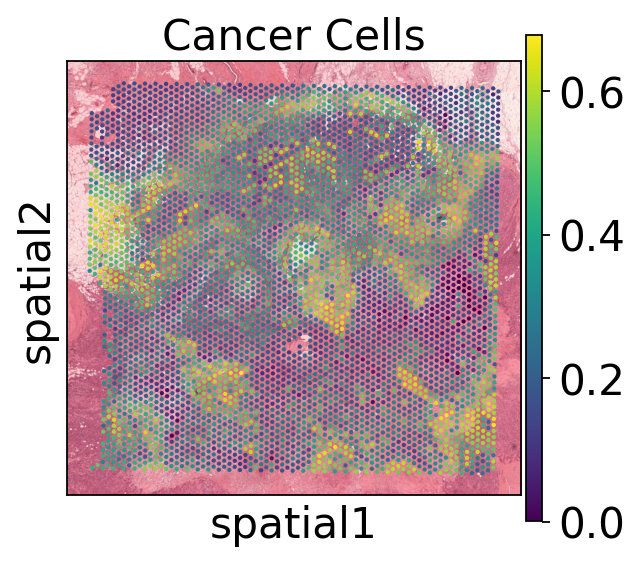

In [12]:
sc.pl.spatial(prop_gex_adata, color = "Cancer Cells")

In [13]:
celltypes = cell_profiles.keys()


adata_objects = {}

from model.analysis_functions import filter_spots_by_celltype_proportion

for celltype in celltypes:
    filtered_adata = filter_spots_by_celltype_proportion(prop_gex_adata, celltype, 0.2)
    print(celltype)
    print(filtered_adata)
    adata_objects[celltype] = filtered_adata


Cancer Cells
AnnData object with n_obs × n_vars = 3906 × 10029
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'size_factors', 'original_total', 'scaled_total', 'Cancer Cells', 'Macrophages', 'CD4 T Cells', 'CD8 T Cells', 'B Cells', 'Endothelial Cells', 'Fibroblasts'
    var: 'gene_ids', 'feature_types', 'genome', 'isotype_control', 'normalized', 'pattern', 'read', 'secondary_name', 'sequence'
    uns: 'spatial'
    obsm: 'spatial'
    layers: 'Fibroblasts_genes_pass1', 'Cancer_Cells_genes_pass1', 'CD8_T_Cells_genes_pass1', 'Macrophages_genes_pass1', 'CD4_T_Cells_genes_pass1', 'Endothelial_Cells_genes_pass1', 'B_Cells_genes_pass1'
Macrophages
AnnData object with n_obs × n_vars = 258 × 10029
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'size_factors', 'original_total', 'scaled_total', 'Cancer Cells', 'Macrophages', 'CD4 T Cells', 'CD8 T Cells', 'B Cells', 'Endothelial Cells', 'Fibroblasts'
    var: 'gene_ids', 'feature_types', 'genome', 'isotype_control', 'nor

/bgfs/alee/LO_LAB/Personal/Alexander_Chang/alc376/envs/CITEgeist_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Cancer Cells


/tmp/ipykernel_155892/1295676955.py:26: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.5)


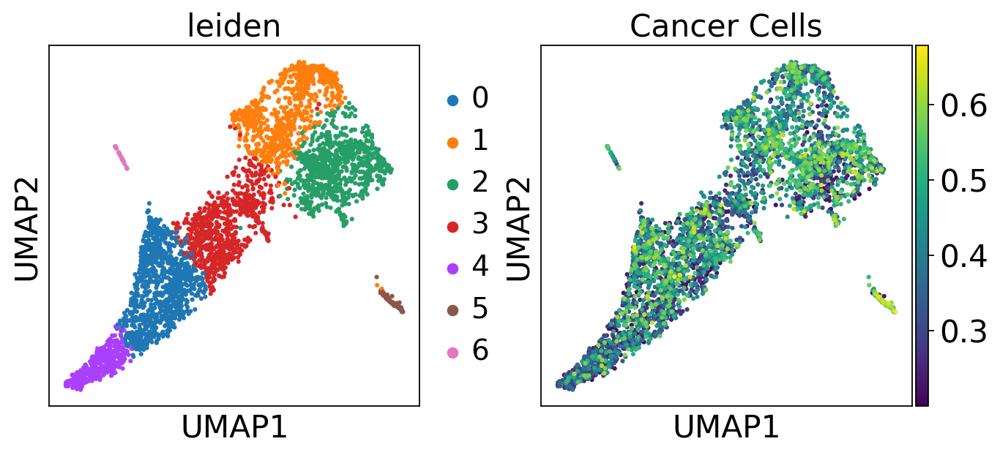

Macrophages


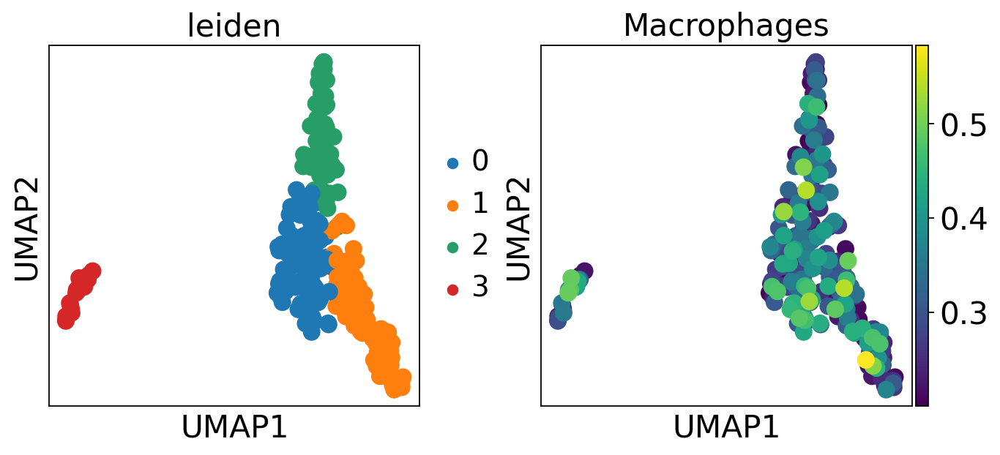

CD4 T Cells


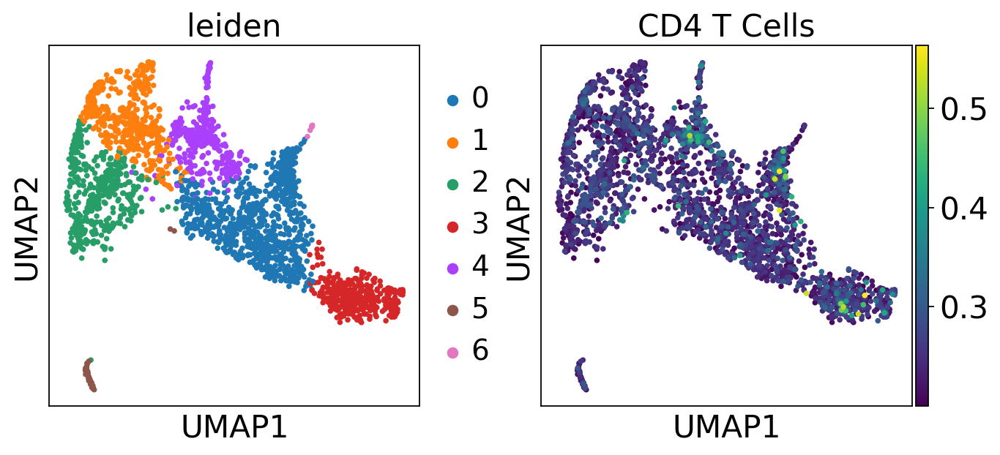

CD8 T Cells


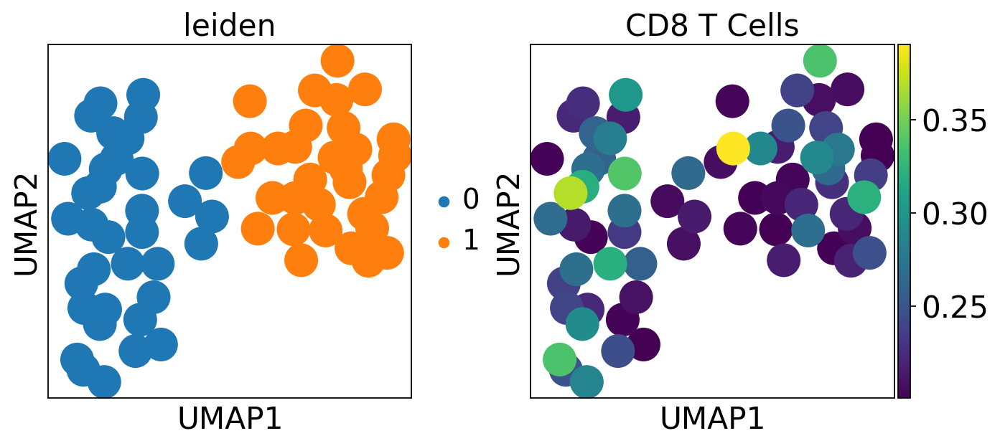

B Cells


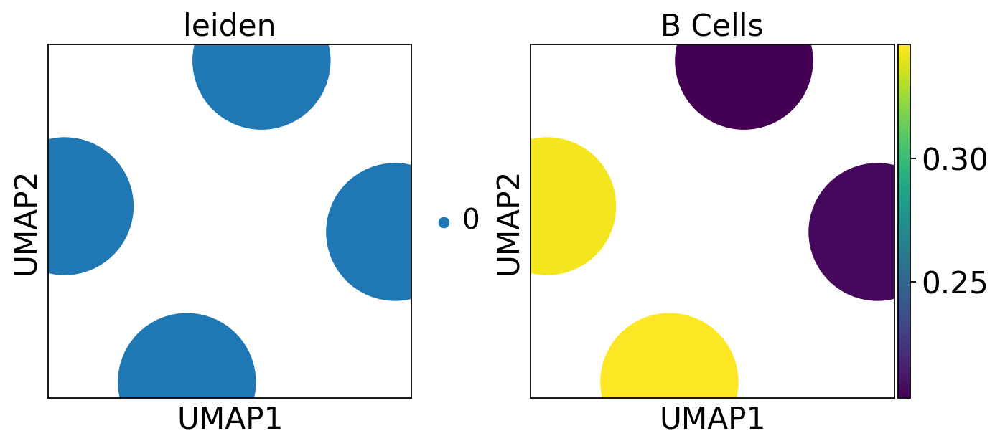

Endothelial Cells


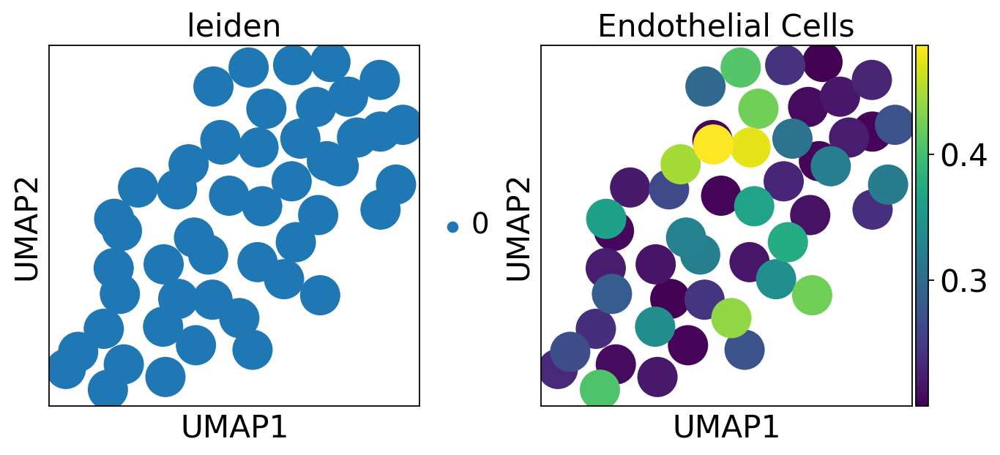

Fibroblasts


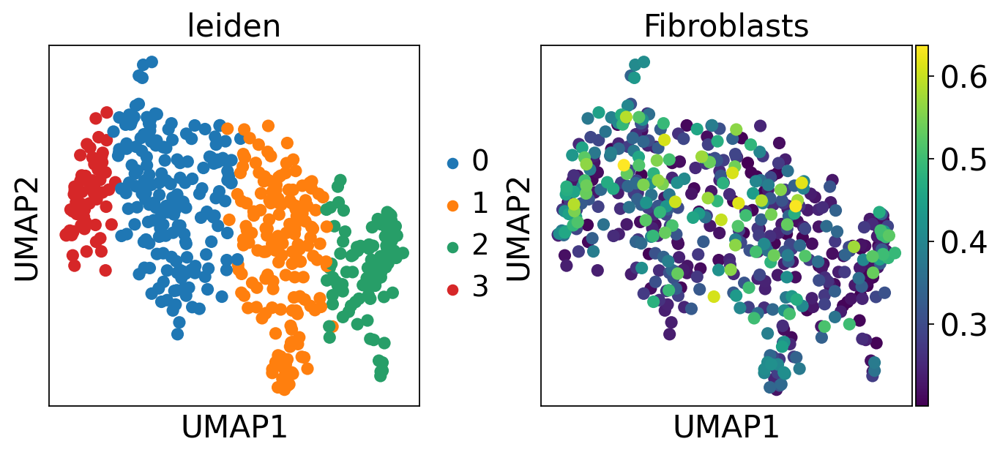

In [14]:
import scanpy as sc
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import umap

def process_adata_objects(adata_objects: dict) -> dict:
    """
    Process each AnnData object in the adata_objects dictionary by performing PCA, UMAP, and Leiden clustering.

    Args:
        adata_objects (dict): Dictionary containing AnnData objects.

    Returns:
        dict: Dictionary containing processed dataframes with UMAP and Leiden results.
    """
    processed_data = {}

    for celltype, adata in adata_objects.items():
        # Standardize the data
        print(celltype)
        celltype_name = celltype.replace(" ", "_")
        layer_name = f"{celltype_name}_genes_pass1"
        sc.pp.log1p(adata, layer=layer_name)
        sc.pp.pca(adata, layer=layer_name, svd_solver='arpack')
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X')
        sc.tl.leiden(adata, resolution=0.5)
        sc.tl.umap(adata, min_dist=0.1)   
        sc.pl.umap(adata, color=['leiden', celltype])
        adata.obs['celltype'] = celltype

        # Switch the .X to the layer
        adata.X = adata.layers[f"{celltype_name}_genes_pass1"]

        processed_data[celltype] = adata
    return processed_data

# Process the adata_objects dictionary
processed_data = process_adata_objects(adata_objects)


Cancer Cells
AnnData object with n_obs × n_vars = 3906 × 10029
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'size_factors', 'original_total', 'scaled_total', 'Cancer Cells', 'Macrophages', 'CD4 T Cells', 'CD8 T Cells', 'B Cells', 'Endothelial Cells', 'Fibroblasts', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'genome', 'isotype_control', 'normalized', 'pattern', 'read', 'secondary_name', 'sequence'
    uns: 'spatial', 'log1p', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'Fibroblasts_genes_pass1', 'Cancer_Cells_genes_pass1', 'CD8_T_Cells_genes_pass1', 'Macrophages_genes_pass1', 'CD4_T_Cells_genes_pass1', 'Endothelial_Cells_genes_pass1', 'B_Cells_genes_pass1'
    obsp: 'distances', 'connectivities'
Macrophages
AnnData object with n_obs × n_vars = 258 × 10029
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'size_factors', 'original_total', 'scaled_total', 'Cancer Cells', '

/bgfs/alee/LO_LAB/Personal/Alexander_Chang/alc376/envs/CITEgeist_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


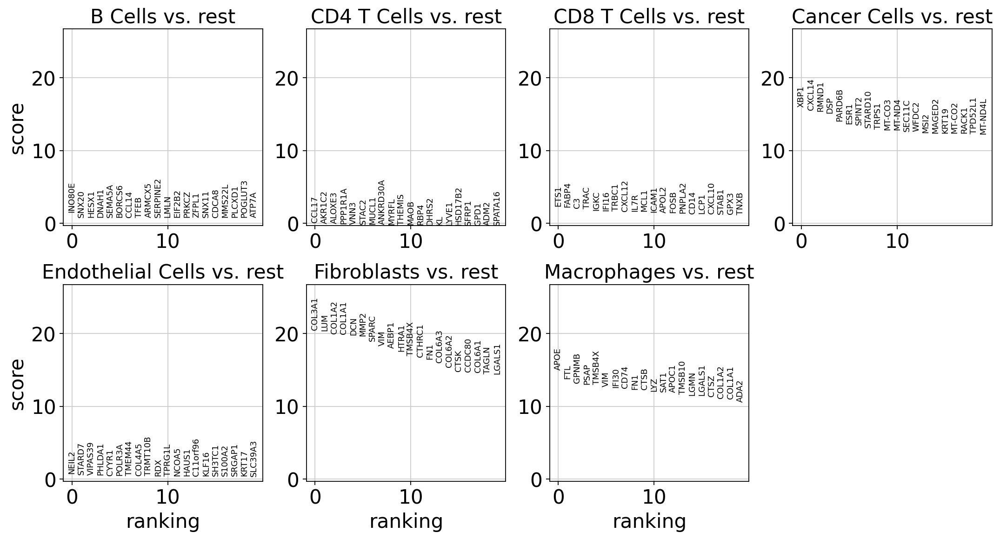

In [15]:
import anndata as ad
import pandas as pd

adatas = []
for celltype, adata in processed_data.items():
    print(celltype)
    print(adata)
    # Explicitly set celltype as categorical with the string label
    adata.obs['celltype'] = pd.Categorical([celltype] * adata.n_obs)
    adatas.append(adata)
    
# Create concatenated AnnData object
combined_adata = ad.concat(
    adatas,
    join="outer"  # Use outer join to keep all genes
)

# Ensure celltype is categorical with the correct string labels
combined_adata.obs['celltype'] = pd.Categorical(combined_adata.obs['celltype'])

# Run rank_genes_groups using celltype as the grouping
sc.tl.rank_genes_groups(
    combined_adata,
    groupby='celltype',
    method='wilcoxon',
    key_added='rank_genes_groups'
)

# Plot the results
sc.pl.rank_genes_groups(combined_adata)

In [16]:
print(combined_adata)


AnnData object with n_obs × n_vars = 7358 × 10029
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'size_factors', 'original_total', 'scaled_total', 'Cancer Cells', 'Macrophages', 'CD4 T Cells', 'CD8 T Cells', 'B Cells', 'Endothelial Cells', 'Fibroblasts', 'leiden', 'celltype'
    uns: 'rank_genes_groups'
    obsm: 'spatial', 'X_pca', 'X_umap'
    layers: 'Fibroblasts_genes_pass1', 'Cancer_Cells_genes_pass1', 'CD8_T_Cells_genes_pass1', 'Macrophages_genes_pass1', 'CD4_T_Cells_genes_pass1', 'Endothelial_Cells_genes_pass1', 'B_Cells_genes_pass1'


In [17]:
from typing import Dict, List, Optional
import pandas as pd
import scanpy as sc

def get_significant_genes_details(
    adata: sc.AnnData,
    group_key: str = 'rank_genes_groups',
    alpha: float = 0.05
) -> Dict[str, pd.DataFrame]:
    """
    Extract detailed statistics for genes with adjusted p-values less than the specified alpha.
    
    Args:
        adata: AnnData object containing rank_genes_groups results
        group_key: Key in adata.uns where rank_genes_groups results are stored
        alpha: Significance level threshold for adjusted p-values
    
    Returns:
        Dictionary mapping group names to DataFrames containing statistics for significant genes
    """
    results = adata.uns[group_key]
    group_names = results['names'].dtype.names
    
    detailed_results = {}
    
    for group in group_names:
        # Create DataFrame with all statistics
        print(group)
        group_df = pd.DataFrame({
            'genes': results['names'][group],
            'scores': results['scores'][group],
            'pvals': results['pvals'][group],
            'pvals_adj': results['pvals_adj'][group],
            'logfoldchanges': results['logfoldchanges'][group]
        })


        # # Filter for significant genes
        significant_df = group_df[group_df['pvals_adj'] < alpha]
        

        # Filter for genes with a logfoldchange greater than 0
        significant_df = significant_df[significant_df['logfoldchanges'] > 0.5]

        # Sort by adjusted p-value
        significant_df.sort_values('pvals_adj', inplace=True)
        
        detailed_results[group] = significant_df

        print(len(significant_df))
    
    return detailed_results

# Example usage:
detailed_results = get_significant_genes_details(combined_adata)

# Print top 5 most significant genes for each group
for group, df in detailed_results.items():
    print(f"\n{group} top 5 significant genes:")
    print(df.head())
    print("Number of significant genes:", len(df))

B Cells
0
CD4 T Cells
0
CD8 T Cells
0
Cancer Cells
7657
Endothelial Cells
0
Fibroblasts
401
Macrophages
492

B Cells top 5 significant genes:
Empty DataFrame
Columns: [genes, scores, pvals, pvals_adj, logfoldchanges]
Index: []
Number of significant genes: 0

CD4 T Cells top 5 significant genes:
Empty DataFrame
Columns: [genes, scores, pvals, pvals_adj, logfoldchanges]
Index: []
Number of significant genes: 0

CD8 T Cells top 5 significant genes:
Empty DataFrame
Columns: [genes, scores, pvals, pvals_adj, logfoldchanges]
Index: []
Number of significant genes: 0

Cancer Cells top 5 significant genes:
    genes     scores         pvals     pvals_adj  logfoldchanges
0    XBP1  15.996955  1.341791e-57  1.345682e-53        2.452945
1  CXCL14  15.600392  7.234771e-55  3.627876e-51        2.450288
2   RMND1  15.406420  1.481983e-53  4.954269e-50        2.741532
3     DSP  15.164021  6.120494e-52  1.534561e-48        2.436715
4  PARD6B  14.054134  7.266484e-45  1.457511e-41        2.753546
Numbe

## Pathway Analysis and Cell-Cell Communication

Using standard Scanpy analysis with GSEApy reveals three distinct cancer cell populations in this patient biopsy. This demonstrates how CITEgeist layers can be easily integrated with existing analytical tools that use Scanpy layers.

We then use COMMOT to analyze cell-cell communication patterns, focusing on ligand-receptor interactions between different cell populations in the spatial context of the tumor microenvironment.

In [18]:
gene_set = ['CellMarker_2024']

B Cells
Skipping B Cells due to insufficient number of genes
CD4 T Cells
Skipping CD4 T Cells due to insufficient number of genes
CD8 T Cells
Skipping CD8 T Cells due to insufficient number of genes
Cancer Cells
Running Cancer Cells


          Gene_set                                               Term  \
0  CellMarker_2024  Meiotic Prophase Fetal Germ Cell Fetal Gonad H...   
1  CellMarker_2024                   Cycling Basal Cell Trachea Mouse   
2  CellMarker_2024  Mitotic Arrest Phase Fetal Germ Cell Fetal Gon...   
3  CellMarker_2024          Type I Spiral Ganglion Neuron Brain Mouse   
4  CellMarker_2024                                 Neuron Brain Mouse   

    Overlap       P-value  Adjusted P-value  Old P-value  \
0  629/1049  2.999248e-48      3.539113e-45            0   
1   163/202  3.027027e-35      1.785946e-32            0   
2   497/956  8.992609e-19      3.537093e-16            0   
3  536/1061  6.193869e-17      1.827191e-14            0   
4   333/616  5.750159e-16      1.357038e-13            0   

   Old Adjusted P-value  Odds Ratio  Combined Score  \
0                     0    2.540710      278.019059   
1                     0    6.862078      545.417818   
2                     0    1.797187

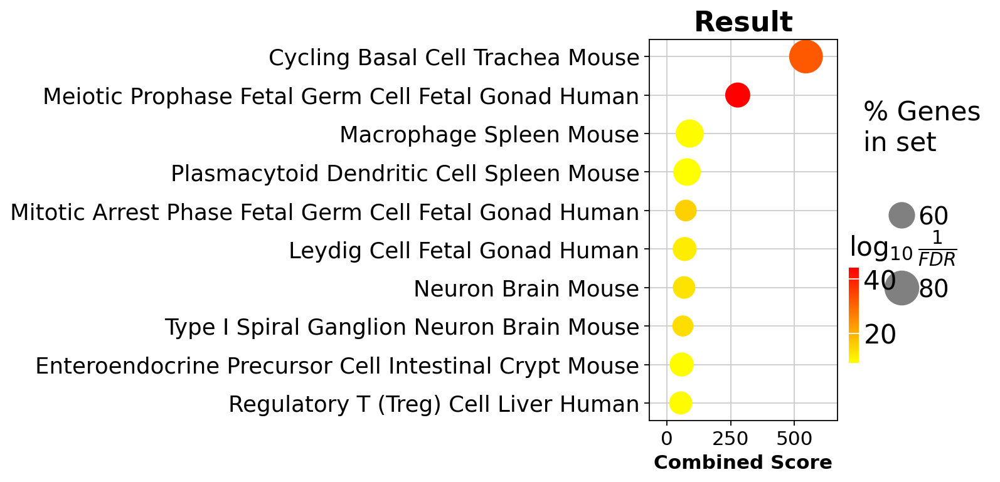

Endothelial Cells
Skipping Endothelial Cells due to insufficient number of genes
Fibroblasts
Running Fibroblasts
          Gene_set                                               Term Overlap  \
0  CellMarker_2024  Fibrocartilage Chondrocyte Articular Cartilage...  48/111   
1  CellMarker_2024                              Fibroblast Skin Mouse   44/90   
2  CellMarker_2024                        Medullary Cell Kidney Mouse  51/166   
3  CellMarker_2024      Schwalie Et al.Nature.G2 Adipose Tissue Mouse  52/189   
4  CellMarker_2024  Microglial Cell Embryonic Prefrontal Cortex Human  74/476   

        P-value  Adjusted P-value  Old P-value  Old Adjusted P-value  \
0  4.229097e-52      4.055704e-49            0                     0   
1  7.961532e-51      3.817555e-48            0                     0   
2  2.624852e-46      8.390778e-44            0                     0   
3  2.004444e-44      4.805654e-42            0                     0   
4  2.722492e-44      5.221741e-42       

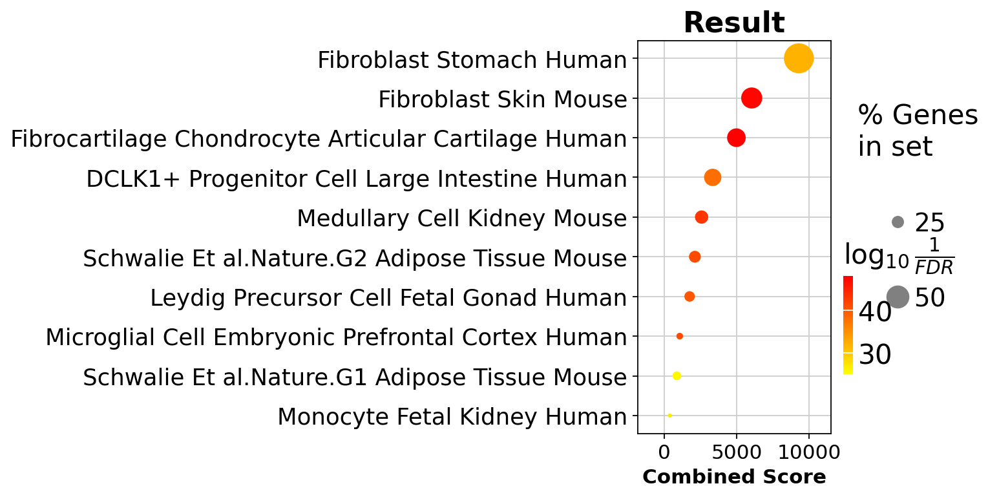

Macrophages
Running Macrophages
          Gene_set                                               Term  \
0  CellMarker_2024  Microglial Cell Embryonic Prefrontal Cortex Human   
1  CellMarker_2024                        Monocyte Fetal Kidney Human   
2  CellMarker_2024                        Microglial Cell Brain Mouse   
3  CellMarker_2024                  Paneth Cell Large Intestine Human   
4  CellMarker_2024                       Macrophage Nasopharynx Human   

   Overlap        P-value  Adjusted P-value  Old P-value  \
0  134/476  4.478332e-106     5.047080e-103            0   
1  141/796   3.478153e-82      1.959939e-79            0   
2  117/658   1.671501e-67      6.279273e-65            0   
3   78/314   5.996750e-56      1.689584e-53            0   
4    33/45   5.953386e-44      1.341893e-41            0   

   Old Adjusted P-value  Odds Ratio  Combined Score  \
0                     0   20.976216     5088.300790   
1                     0   11.562485     2168.722911   
2  

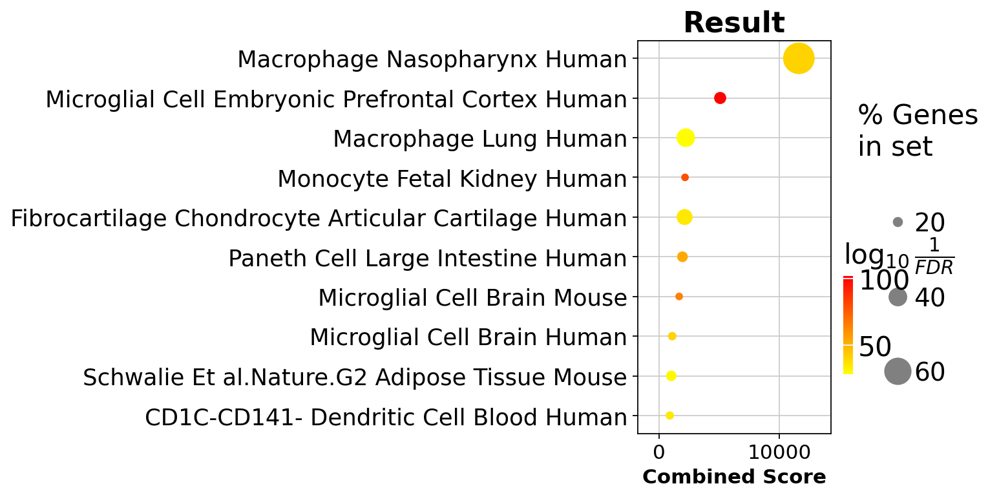

In [19]:
import gseapy as gp
import matplotlib.pyplot as plt

# Print top 5 most significant genes for each group
for group, df in detailed_results.items():
    print(group)
    genes = df['genes'].tolist()

    if len(genes) < 20:
        print(f"Skipping {group} due to insufficient number of genes")
        continue
    else:
        print(f"Running {group}")
    enr = gp.enrichr(gene_list=genes, 
                    gene_sets=gene_set,
                    organism='Human', # or 'Mouse' for mouse genes
                    outdir='enrichr_kegg')
    print(enr.results.head())
    print(group)
    gp.dotplot(enr.res2d,
    figsize=(3,5),
    title="Result",
    cmap = plt.cm.autumn_r,
    size=5)
    plt.show()

In [20]:
import commot as ct
import scanpy as sc
import pandas as pd
import numpy as np

In [21]:
import importlib
import model
importlib.reload(model)
from model.analysis_functions import expand_prop_gex_adata

expanded_adata = expand_prop_gex_adata(prop_gex_adata, celltype_profile_dict=cell_profiles)
print(expanded_adata)

AnnData object with n_obs × n_vars = 7358 × 10029
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'size_factors', 'original_total', 'scaled_total', 'Cancer Cells', 'Macrophages', 'CD4 T Cells', 'CD8 T Cells', 'B Cells', 'Endothelial Cells', 'Fibroblasts', 'celltype'
    var: 'gene_ids', 'feature_types', 'genome', 'isotype_control', 'normalized', 'pattern', 'read', 'secondary_name', 'sequence'
    uns: 'spatial'
    obsm: 'spatial'
    layers: 'Fibroblasts_genes_pass1', 'Cancer_Cells_genes_pass1', 'CD8_T_Cells_genes_pass1', 'Macrophages_genes_pass1', 'CD4_T_Cells_genes_pass1', 'Endothelial_Cells_genes_pass1', 'B_Cells_genes_pass1'


In [22]:
df_ligrec=ct.pp.ligand_receptor_database(database='CellChat', species='human')

df_cellchat_filtered = ct.pp.filter_lr_database(df_ligrec, expanded_adata, min_cell_pct=0.01)

print(df_cellchat_filtered)

         0                    1         2                   3
0    TGFB3        TGFBR1_TGFBR2      TGFb  Secreted Signaling
1    TGFB3        ACVR1B_TGFBR2      TGFb  Secreted Signaling
2    TGFB3  ACVR1_TGFBR1_TGFBR2      TGFb  Secreted Signaling
3    GDF11        TGFBR1_ACVR2A       GDF  Secreted Signaling
4    GDF11        TGFBR1_ACVR2B       GDF  Secreted Signaling
..     ...                  ...       ...                 ...
95    GAS6                  AXL       GAS  Secreted Signaling
96    GAS6                MERTK       GAS  Secreted Signaling
97     GRN                SORT1       GRN  Secreted Signaling
98  LGALS9               HAVCR2  GALECTIN  Secreted Signaling
99  LGALS9                 CD44  GALECTIN  Secreted Signaling

[100 rows x 4 columns]


In [23]:
ct.tl.spatial_communication(expanded_adata, database_name='cellchat', df_ligrec=df_cellchat_filtered, dis_thr=500, heteromeric=True, pathway_sum=False)

... storing 'celltype' as categorical


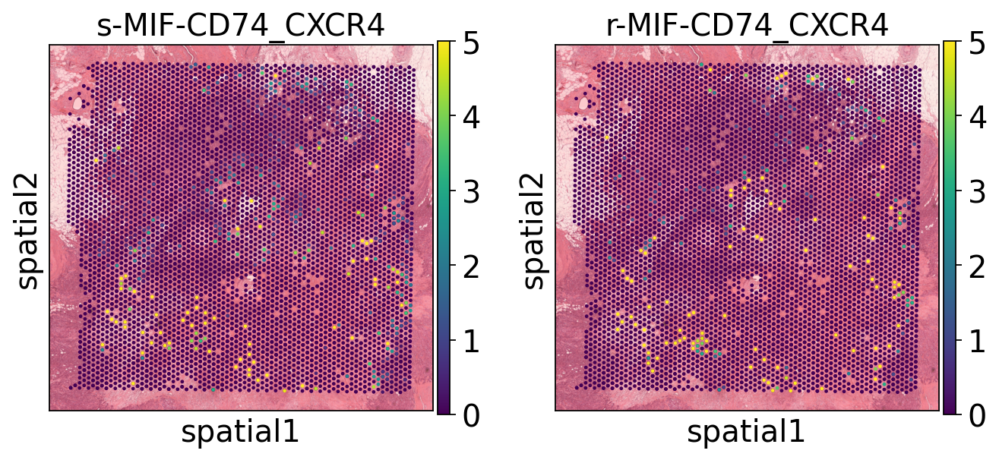

In [24]:
sc.set_figure_params(fontsize=18)

pathway = 'MIF-CD74_CXCR4'

if f's-{pathway}' in expanded_adata.obsm['commot-cellchat-sum-sender'].columns:
    expanded_adata.obs[f's-{pathway}'] = expanded_adata.obsm['commot-cellchat-sum-sender'][f's-{pathway}']
    expanded_adata.obs[f'r-{pathway}'] = expanded_adata.obsm['commot-cellchat-sum-receiver'][f'r-{pathway}']
else:
    expanded_adata.obs[f's-{pathway}'] = np.zeros(expanded_adata.n_obs)
    expanded_adata.obs[f'r-{pathway}'] = np.zeros(expanded_adata.n_obs)
sc.pl.spatial(expanded_adata, color=[f's-{pathway}',f'r-{pathway}'], wspace = 0.2, vmin = 0, vmax = 5)

In [25]:
expanded_adata.write("./examples/expanded_adata_dis_thr_500_nosum.h5ad")

In [26]:
print(expanded_adata)

AnnData object with n_obs × n_vars = 7358 × 10029
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'size_factors', 'original_total', 'scaled_total', 'Cancer Cells', 'Macrophages', 'CD4 T Cells', 'CD8 T Cells', 'B Cells', 'Endothelial Cells', 'Fibroblasts', 'celltype', 's-MIF-CD74_CXCR4', 'r-MIF-CD74_CXCR4'
    var: 'gene_ids', 'feature_types', 'genome', 'isotype_control', 'normalized', 'pattern', 'read', 'secondary_name', 'sequence'
    uns: 'spatial', 'commot-cellchat-info'
    obsm: 'spatial', 'commot-cellchat-sum-sender', 'commot-cellchat-sum-receiver'
    layers: 'Fibroblasts_genes_pass1', 'Cancer_Cells_genes_pass1', 'CD8_T_Cells_genes_pass1', 'Macrophages_genes_pass1', 'CD4_T_Cells_genes_pass1', 'Endothelial_Cells_genes_pass1', 'B_Cells_genes_pass1'
    obsp: 'commot-cellchat-GRN-SORT1', 'commot-cellchat-ANGPTL4-SDC3', 'commot-cellchat-ANGPTL4-SDC2', 'commot-cellchat-ANGPTL4-CDH11', 'commot-cellchat-ANGPTL4-CDH5', 'commot-cellchat-ANGPTL4-SDC4', 'commot-cellchat-ANGPTL4

In [27]:
sender_signal = expanded_adata.obsm['commot-cellchat-sum-sender']
reciever_signal = expanded_adata.obsm['commot-cellchat-sum-receiver']


In [28]:
print(sender_signal.head())

                                 s-GRN-SORT1  s-ANGPTL4-SDC3  s-ANGPTL4-SDC2  \
AACACTTGGCAAGGAA-1_Cancer Cells          0.0             0.0             0.0   
AACAGGAAGAGCATAG-1_Cancer Cells          0.0             0.0             0.0   
AACAGGATTCATAGTT-1_Cancer Cells          0.0             0.0             0.0   
AACAGGTTATTGCACC-1_Cancer Cells          0.0             0.0             0.0   
AACAGTCAGGCTCCGC-1_Cancer Cells          0.0             0.0             0.0   

                                 s-ANGPTL4-CDH11  s-ANGPTL4-CDH5  \
AACACTTGGCAAGGAA-1_Cancer Cells              0.0             0.0   
AACAGGAAGAGCATAG-1_Cancer Cells              0.0             0.0   
AACAGGATTCATAGTT-1_Cancer Cells              0.0             0.0   
AACAGGTTATTGCACC-1_Cancer Cells              0.0             0.0   
AACAGTCAGGCTCCGC-1_Cancer Cells              0.0             0.0   

                                 s-ANGPTL4-SDC4  s-ANGPTL4-ITGA5_ITGB1  \
AACACTTGGCAAGGAA-1_Cancer Cells     

In [29]:
# Calculate the mean of each column
series = sender_signal.mean()
# Filter columns with non-zero means
nonzero_series = series[series != 0]

# Sort columns by mean values in descending order
nonzero_series.sort_values(ascending=False, inplace=True)

nonzero_series.head(20)

s-total-total          5.915864
s-GDF15-TGFBR2         0.271949
s-MDK-SDC2             0.266503
s-MDK-NCL              0.266347
s-MDK-SDC4             0.261799
s-MIF-CD74_CD44        0.225812
s-SPP1-CD44            0.213277
s-MDK-LRP1             0.207103
s-SEMA3C-PLXND1        0.194582
s-CXCL12-CXCR4         0.175863
s-GRN-SORT1            0.171378
s-GAS6-MERTK           0.162787
s-POSTN-ITGAV_ITGB5    0.158445
s-GAS6-AXL             0.157069
s-TNFSF12-TNFRSF12A    0.153438
s-MIF-CD74_CXCR4       0.152280
s-SPP1-ITGAV_ITGB1     0.147638
s-C3-C3AR1             0.133746
s-ADM-CALCRL           0.113618
s-NAMPT-INSR           0.113470
dtype: float64


Top 20 pathways by mean nonzero signal strength:
s-total-total          21.008170
s-FGF7-FGFR1            5.449233
s-PDGFA-PDGFRB          4.172685
s-LGALS9-CD44           3.842079
s-CCL14-ACKR1           3.841590
s-ANGPTL4-SDC4          3.825344
s-ADM-CALCRL            3.619048
s-SEMA3C-PLXND1         3.561536
s-IGF1-IGF1R            3.507237
s-TNFSF12-TNFRSF12A     3.263006
s-FGF7-FGFR2            3.146832
s-SPP1-CD44             3.138579
s-GDF15-TGFBR2          3.097523
s-ANGPTL4-SDC2          3.026133
s-LGALS9-HAVCR2         2.947142
s-NAMPT-INSR            2.879013
s-ANGPTL4-SDC3          2.839663
s-CSF1-CSF1R            2.792899
s-PDGFB-PDGFRB          2.770152
s-CXCL12-CXCR4          2.701461
dtype: float64


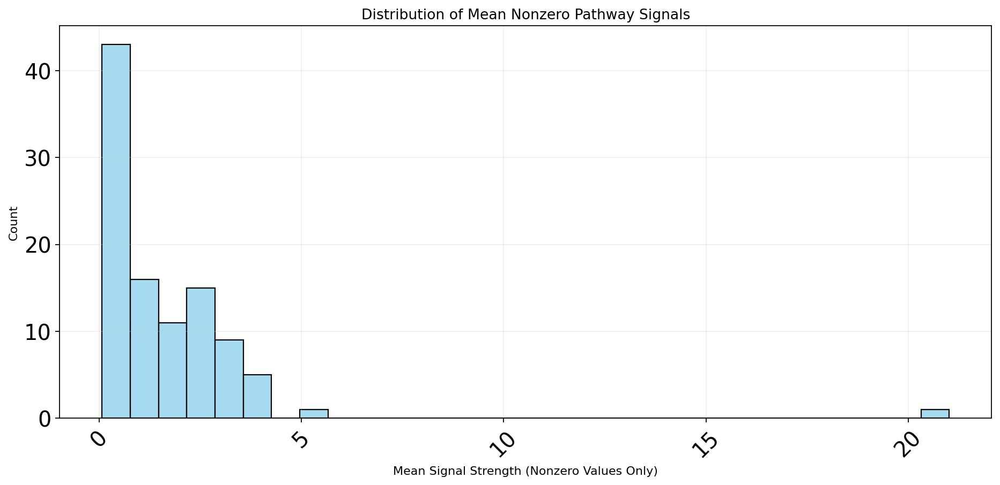

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


sender_signal = expanded_adata.obsm['commot-cellchat-sum-sender']
reciever_signal = expanded_adata.obsm['commot-cellchat-sum-receiver']

# Calculate the mean of nonzero values for each column
series = sender_signal.apply(lambda x: x[x != 0].mean())
# Filter columns with non-zero means
nonzero_series = series[series != 0]

# Print top 20 pathways
print("\nTop 20 pathways by mean nonzero signal strength:")
print(nonzero_series.sort_values(ascending=False).head(20))

# Create figure and axis with a larger size
plt.figure(figsize=(12, 6))

# Create histogram using seaborn for better styling
sns.histplot(data=nonzero_series, bins=30, color='skyblue', edgecolor='black')

# Customize the plot
plt.title('Distribution of Mean Nonzero Pathway Signals', fontsize=12)
plt.xlabel('Mean Signal Strength (Nonzero Values Only)', fontsize=10)
plt.ylabel('Count', fontsize=10)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add grid for better readability
plt.grid(True, alpha=0.3)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show the plot
plt.show()



In [31]:
# Add celltype as an categorial obs and then run all the ct functions.

expanded_adata.obs['celltype'] = expanded_adata.obs_names.str.split('_').str[1]
expanded_adata.obs['celltype'] = expanded_adata.obs['celltype'].astype('category')


In [32]:
# Add this before the plotting command to check for NaN values
print("NaN values in spatial coordinates:", 
      np.any(np.isnan(expanded_adata.obsm["spatial"])))

# You can also check which spots have NaN coordinates
if np.any(np.isnan(expanded_adata.obsm["spatial"])):
    nan_spots = np.where(np.isnan(expanded_adata.obsm["spatial"]).any(axis=1))[0]
    print("Spots with NaN coordinates:", nan_spots)

NaN values in spatial coordinates: False


In [33]:
# Filter out spots with NaN coordinates
valid_spots = ~np.isnan(expanded_adata.obsm["spatial"]).any(axis=1)
expanded_adata = expanded_adata[valid_spots].copy()

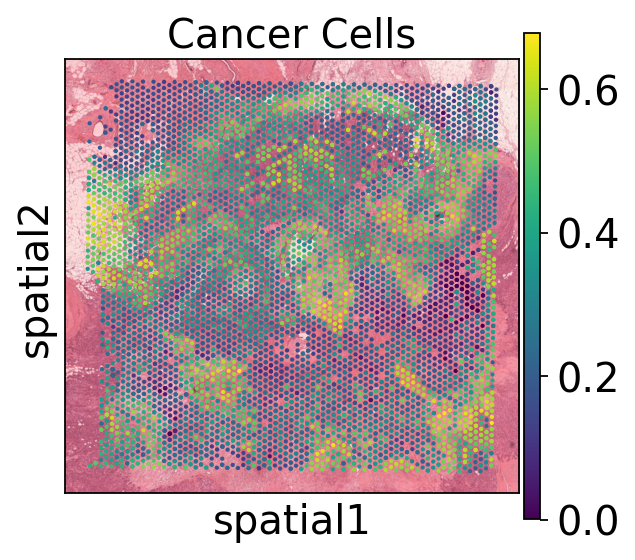

In [34]:
sc.pl.spatial(expanded_adata, color='Cancer Cells')

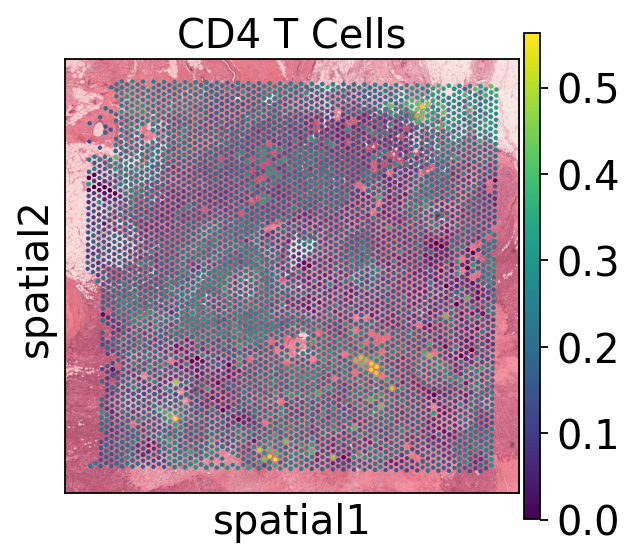

In [35]:
sc.pl.spatial(expanded_adata, color='CD4 T Cells')

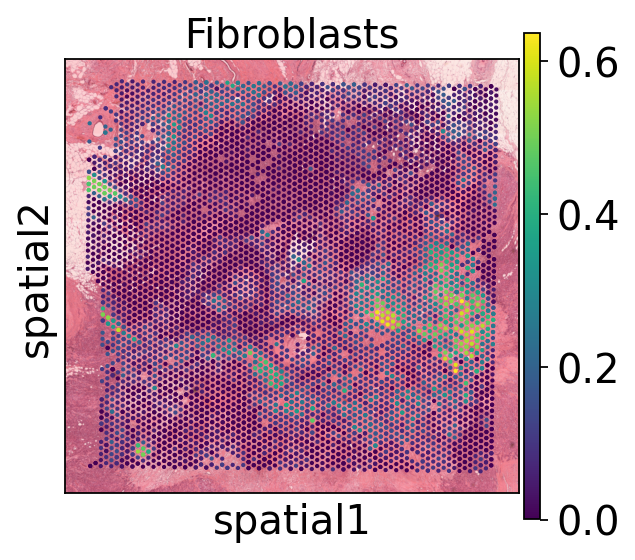

In [36]:
sc.pl.spatial(expanded_adata, color='Fibroblasts')

In [37]:
sender_signal = expanded_adata.obsm['commot-cellchat-sum-sender']

# Calculate the mean of nonzero values for each column
series = sender_signal.apply(lambda x: x[x != 0].mean())
# Filter columns with non-zero means
nonzero_series = series[series != 0]

# Print top 20 pathways
print("\nTop 20 sender pathways in Cancer Cells by mean nonzero signal strength:")
print(nonzero_series.sort_values(ascending=False).head(20))



Top 20 sender pathways in Cancer Cells by mean nonzero signal strength:
s-total-total          21.008170
s-FGF7-FGFR1            5.449233
s-PDGFA-PDGFRB          4.172685
s-LGALS9-CD44           3.842079
s-CCL14-ACKR1           3.841590
s-ANGPTL4-SDC4          3.825344
s-ADM-CALCRL            3.619048
s-SEMA3C-PLXND1         3.561536
s-IGF1-IGF1R            3.507237
s-TNFSF12-TNFRSF12A     3.263006
s-FGF7-FGFR2            3.146832
s-SPP1-CD44             3.138579
s-GDF15-TGFBR2          3.097523
s-ANGPTL4-SDC2          3.026133
s-LGALS9-HAVCR2         2.947142
s-NAMPT-INSR            2.879013
s-ANGPTL4-SDC3          2.839663
s-CSF1-CSF1R            2.792899
s-PDGFB-PDGFRB          2.770152
s-CXCL12-CXCR4          2.701461
dtype: float64


## Validation with Human Protein Atlas

To validate our findings, we compare our results with expression data from the Human Protein Atlas (HPA). This comparison helps verify the biological relevance of the identified signaling pathways and cell-type specific expression patterns.

The analysis includes correlation studies between CITEgeist's sender signals and HPA expression levels, providing an additional layer of validation for our findings.

In [38]:
all_sender_pathways = nonzero_series.sort_values(ascending=False)

In [39]:
print(len(all_sender_pathways))

101


In [40]:
sender_signal = expanded_adata.obsm['commot-cellchat-sum-sender']

# Calculate the mean of nonzero values for each column
series = sender_signal.apply(lambda x: x[x != 0].mean())
# Filter columns with non-zero means
nonzero_series = series[series != 0]



for path in all_sender_pathways.index:
    path = path[2:]

    if path == 'total-total':
        continue

    # Get sender and receiver signals
    sender_signal_df = expanded_adata.obsm['commot-cellchat-sum-sender']
    receiver_signal_df = expanded_adata.obsm['commot-cellchat-sum-receiver']
    
    sender_signal = sender_signal_df[f's-{path}'].copy()
    receiver_signal = receiver_signal_df[f'r-{path}'].copy()

    # Get celltypes
    sender_celltype = sender_signal.index.str.split('_').str[1]
    receiver_celltype = receiver_signal.index.str.split('_').str[1]

    # Group by celltype and get means of nonzero values only
    sender_by_celltype = sender_signal[sender_signal != 0].groupby(sender_celltype[sender_signal != 0]).mean()
    receiver_by_celltype = receiver_signal[receiver_signal != 0].groupby(receiver_celltype[receiver_signal != 0]).mean()

    # Sort both by mean values
    sender_by_celltype = sender_by_celltype.sort_values(ascending=False)
    receiver_by_celltype = receiver_by_celltype.sort_values(ascending=False)

    print(f"\n=== {path} Pathway ===")
    print("\nTop Sending and Receiving Celltypes:")
    print("-" * 60)
    print(f"{'Sender':25} {'Signal':10} | {'Receiver':25} {'Signal':10}")
    print("-" * 60)

    # Get max length to iterate over
    max_len = max(len(sender_by_celltype), len(receiver_by_celltype))
    
    # Print side by side
    for i in range(max_len):
        sender_cell = ""
        sender_val = ""
        receiver_cell = ""
        receiver_val = ""
        
        if i < len(sender_by_celltype):
            sender_cell = sender_by_celltype.index[i]
            sender_val = f"{sender_by_celltype.iloc[i]:.4f}"
            
        if i < len(receiver_by_celltype):
            receiver_cell = receiver_by_celltype.index[i]
            receiver_val = f"{receiver_by_celltype.iloc[i]:.4f}"
            
        print(f"{sender_cell:25} {sender_val:10} | {receiver_cell:25} {receiver_val:10}")

    print("-" * 60)
    print("\n")



=== FGF7-FGFR1 Pathway ===

Top Sending and Receiving Celltypes:
------------------------------------------------------------
Sender                    Signal     | Receiver                  Signal    
------------------------------------------------------------
Macrophages               8.8481     | Fibroblasts               5.7939    
Endothelial Cells         7.1578     | Macrophages               4.2565    
Fibroblasts               7.0938     | CD8 T Cells               1.5772    
Cancer Cells              3.5649     | CD4 T Cells               1.4449    
CD4 T Cells               3.4354     | Cancer Cells              1.4300    
------------------------------------------------------------



=== PDGFA-PDGFRB Pathway ===

Top Sending and Receiving Celltypes:
------------------------------------------------------------
Sender                    Signal     | Receiver                  Signal    
------------------------------------------------------------
Endothelial Cells         2

In [41]:
# Read in .tsv file from HPA
hpa_df = pd.read_csv("examples/rna_single_cell_type.tsv", sep="\t")


In [42]:
print(hpa_df['Cell type'].unique())

['Adipocytes' 'Alveolar cells type 1' 'Alveolar cells type 2' 'Astrocytes'
 'B-cells' 'Basal keratinocytes' 'Basal prostatic cells'
 'Basal respiratory cells' 'Basal squamous epithelial cells'
 'Bipolar cells' 'Breast glandular cells' 'Breast myoepithelial cells'
 'Cardiomyocytes' 'Cholangiocytes' 'Ciliated cells' 'Club cells'
 'Collecting duct cells' 'Cone photoreceptor cells' 'Cytotrophoblasts'
 'dendritic cells' 'Distal enterocytes' 'Distal tubular cells'
 'Ductal cells' 'Early spermatids' 'Endometrial stromal cells'
 'Endothelial cells' 'Enteroendocrine cells' 'Erythroid cells'
 'Excitatory neurons' 'Exocrine glandular cells'
 'Extravillous trophoblasts' 'Fibroblasts' 'Gastric mucus-secreting cells'
 'Glandular and luminal cells' 'granulocytes' 'Granulosa cells'
 'Hepatocytes' 'Hofbauer cells' 'Horizontal cells' 'Inhibitory neurons'
 'Intestinal goblet cells' 'Ionocytes' 'Kupffer cells' 'Langerhans cells'
 'Late spermatids' 'Leydig cells' 'Lymphatic endothelial cells'
 'Macrophages

global_sender_vals [0.0, 0.0333923322643345, 0.0, 0.031030590416739272, 0.14607725597339644, 0.7348111055556349, 0.2743583798935727, 0.0, 0.01843229459530982, 0.44798243962831114, 0.05545399344439168, 0.46938775510204384, 0.42732119960689996, 0.2201836690769614, 0.0, 0.024400714388309732, 0.024792485605533907, 0.055075149912608166, 0.0, 0.32041863661721326, 0.6161662216516637, 0.0, 0.007539264601253364, 0.018894679935950398, 0.027212959307659983, 0.0, 0.4270926166838589, 0.463719280994539, 0.0, 0.009723100420928943, 0.17893400748907617, 0.05778373362018375, 0.17065736897017802, 0.201065716765217, 0.10015086158239382, 0.0, 0.023716951788491415, 0.16417910447761275, 0.15769773087524236, 0.0, 0.18731606215399316, 0.20930232558139583, 0.0, 0.05379765149441707, 0.0, 0.18517670469575417, 0.0, 0.8674492855913072, 0.5217453337504829, 0.0, 0.017385029899118755, 0.04379216771270714, 0.0371247029899611, 0.09609075405041867, 0.4975259060492524, 0.3196470790319323, 0.0, 0.030835728935900343, 0.2686

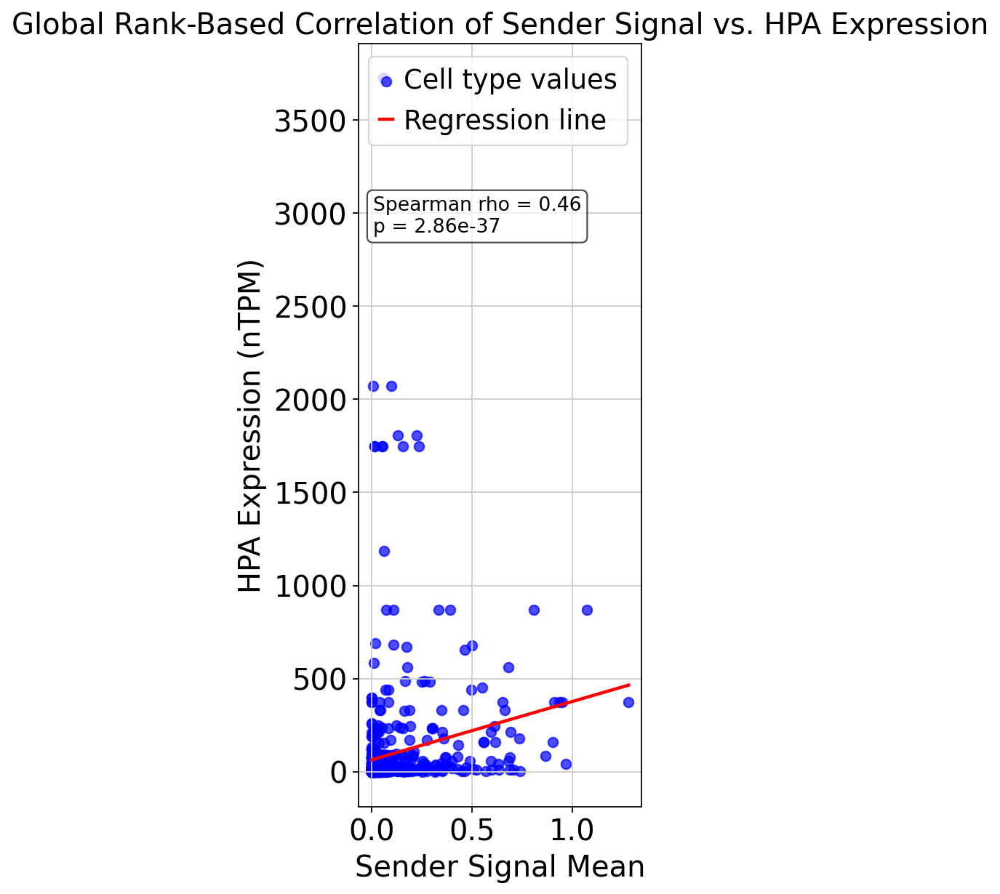

: 

In [ ]:
import pandas as pd
import numpy as np
import logging
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# Set up logging for debugging.
logging.basicConfig(level=logging.DEBUG, format='%(levelname)s: %(message)s')

# Define the mapping from sender cell types (from the signal data) to HPA cell types.
# Adjust these mappings as appropriate.
mapping = {
    "CD8 T Cells": "T-cells",
    "CD4 T Cells": "T-cells",
    "Fibroblasts": "Fibroblasts",
    "Macrophages": "Macrophages",
    "Cancer Cells": "Breast glandular cells",  # closest proxy to cancer in HPA
    "B Cells": "B-cells",
    "Endothelial Cells": "Endothelial cells"
}

# Containers to aggregate the per-pathway data.
global_sender_vals = []  # sender signal mean per cell type per pathway
global_hpa_vals = []     # corresponding HPA nTPM (averaged) for the mapped cell type
global_pathways   = []   # pathway labels (for debugging/plotting if desired)

# Loop over pathways from your top_20_pathways index.
for pathway in all_sender_pathways.index:
    # Remove the two-character prefix (if needed) and skip a possible "total-total" entry.
    path = pathway[2:]
    if path == 'total-total':
        continue

    # 1. Identify the ligand from the pathway (assumed to be the part before the hyphen).
    ligand = path.split('-')[0]
    
    # Subset HPA data for this ligand.
    hpa_subset = hpa_df[hpa_df["Gene name"] == ligand]
    if hpa_subset.empty:
        logging.debug(f"Ligand '{ligand}' not found in HPA data for pathway '{path}'; skipping pathway.")
        continue

    # 2. Get the sender signal values for this pathway.
    sender_signal_df = expanded_adata.obsm['commot-cellchat-sum-sender']
    try:
        # Expect a column named like "s-{path}"
        sender_signal = sender_signal_df[f's-{path}'].copy()
    except KeyError:
        logging.debug(f"Sender signal column for pathway '{path}' not found; skipping pathway.")
        continue

    # Assume that the cell type is encoded in the index as "spot_celltype" (split on '_').
    sender_celltypes = sender_signal.index.str.split('_').str[1]
    unique_sender_cells = np.unique(sender_celltypes)

    # Create lists to store values for this pathway.
    pathway_sender_vals = []
    pathway_hpa_vals = []
    pathway_cells = []  # store sender cell type names (before mapping)

    # 3. For each sender cell type (from the signal data) that is in our mapping,
    #    compute the mean sender signal and get the corresponding HPA value.
    for cell in unique_sender_cells:
        if cell not in mapping:
            # Skip cell types not in our mapping.
            logging.debug(f"Sender cell type '{cell}' not in mapping dictionary; skipping.")
            continue
        mapped_cell = mapping[cell]
        # Compute the mean sender signal for this cell type.
        sender_val = np.mean(sender_signal[sender_celltypes == cell].values)
        
        # In the HPA subset, look for rows whose "Cell type" matches the mapped cell type.
        # Use case-insensitive matching.
        hpa_matches = hpa_subset[hpa_subset["Cell type"].str.lower() == mapped_cell.lower()]
        if hpa_matches.empty:
            logging.debug(f"For pathway '{path}', sender cell type '{cell}' (mapped to '{mapped_cell}') "
                          f"was not found in HPA data; skipping this cell type.")
            continue
        # Take the average nTPM value if more than one row exists.
        hpa_val = np.mean(hpa_matches["nTPM"].values)
        
        pathway_sender_vals.append(sender_val)
        pathway_hpa_vals.append(hpa_val)
        pathway_cells.append(cell)
    
    # Check that we have at least two matching cell types to compute a rank correlation.
    if len(pathway_sender_vals) < 2:
        logging.debug(f"Not enough matching cell types for pathway '{path}' to compute rank correlation; skipping.")
        continue

    # Compute the Spearman rank correlation for this pathway.
    corr, p_corr = spearmanr(pathway_sender_vals, pathway_hpa_vals)
    logging.info(f"Pathway '{path}': cell types {pathway_cells} -> Spearman rho = {corr:.2f}, p = {p_corr:.2e}")

    # Append the per-cell values to the global lists.
    global_sender_vals.extend(pathway_sender_vals)
    global_hpa_vals.extend(pathway_hpa_vals)
    global_pathways.extend([path] * len(pathway_sender_vals))

print("global_sender_vals", global_sender_vals)
print("global_hpa_vals", global_hpa_vals)

# 4. Compute the global rank-based correlation (across all pathways)
if len(global_sender_vals) >= 2:
    global_corr, global_p = spearmanr(global_sender_vals, global_hpa_vals)
    logging.info(f"Global rank-based correlation across pathways: Spearman rho = {global_corr:.2f}, p = {global_p:.2e}")

    # 5. Plotting the Global Correlation with a Regression Line
    if len(global_sender_vals) > 1:
        plt.figure(figsize=(4, 8))
        plt.scatter(global_sender_vals, global_hpa_vals, color='blue', alpha=0.7, label='Cell type values')
        plt.xlabel("Sender Signal Mean")
        plt.ylabel("HPA Expression (nTPM)")
        plt.title("Global Rank-Based Correlation of Sender Signal vs. HPA Expression")
        
        # Fit a linear regression line through the points.
        coeffs = np.polyfit(global_sender_vals, global_hpa_vals, 1)
        fit_fn = np.poly1d(coeffs)
        x_line = np.linspace(min(global_sender_vals), max(global_sender_vals), 100)
        plt.plot(x_line, fit_fn(x_line), color='red', lw=2, label='Regression line')
        
        # Annotate the plot with the Spearman correlation coefficient and p-value.
        plt.annotate(f"Spearman rho = {global_corr:.2f}\np = {global_p:.2e}",
                    xy=(0.05, 0.8), xycoords='axes fraction',
                    fontsize=12, horizontalalignment='left', verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
        plt.legend()
        plt.tight_layout()
        plt.savefig("global_correlation_plot.svg")
        plt.show()
    else:
        logging.info("Not enough data points to generate a global correlation plot.")

